In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")
pd.set_option('display.max_columns',None)
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [3]:
df.shape

(1000, 40)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [5]:
df.columns.to_list()

['months_as_customer',
 'age',
 'policy_number',
 'policy_bind_date',
 'policy_state',
 'policy_csl',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'capital-gains',
 'capital-loss',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'property_damage',
 'bodily_injuries',
 'witnesses',
 'police_report_available',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_make',
 'auto_model',
 'auto_year',
 'fraud_reported',
 '_c39']

In [6]:
df.drop('_c39',axis=1,inplace=True)

In [7]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

# Data Preprocessing

In [8]:
df.drop(columns = ['policy_number','incident_location'],axis = 1,inplace = True)

In [9]:
df.shape

(1000, 37)

In [10]:
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

194    8
285    7
140    7
230    7
128    7
      ..
347    1
113    1
337    1
117    1
0      1
Name: months_as_customer, Length: 391, dtype: int64


43    49
39    48
41    45
34    44
30    42
31    42
38    42
37    41
33    39
32    38
40    38
29    35
46    33
35    32
36    32
42    32
44    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
25    14
49    14
55    14
50    13
53    13
61    10
24    10
54    10
60     9
51     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
22     1
20     1
19     1
Name: age, dtype: int64


05-08-1992    3
28-04-1992    3
01-01-2006    3
25-12-2013    2
28-01-2010    2
             ..
15-03-1992    1
23-07-2014    1
03-08-2009    1
16-07-1995    1
14-06-2004    1
Name: policy_bind_date, Length: 951, dtype: int64


OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


1000    351
500     342
2000    3

From the values we can observe,
1. The features collision_type, police_report_available, property_damage have ? as values.
2. The features umbrella_limit has a about 80% of it's values as 0, so we can drop it. 
3. The feature insured_zip, is a list of unique numbers, so let us drop it.

In [11]:
df.drop('umbrella_limit',axis=1,inplace=True)

In [13]:
df.drop('insured_zip',axis=1,inplace=True)

Let us retrieve the day, month and year from the features policy_bind_day and incident_date

In [14]:
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

In [15]:
# Extracting Day, Month and Year column from policy_bind_date
df['policy_bind_day'] = df['policy_bind_date'].dt.day
df['policy_bind_month'] = df['policy_bind_date'].dt.month
df['policy_bind_year'] = df['policy_bind_date'].dt.year

# Extracting Day, Month and Year column from incident_date
df['incident_day'] = df['incident_date'].dt.day
df['incident_month'] = df['incident_date'].dt.month
df['incident_year'] = df['incident_date'].dt.year

In [16]:
df.drop(['policy_bind_date','incident_date'],axis=1,inplace=True)

#### To find where the ? data is present throughout the dataset

In [21]:
df[df.columns[(df=="?").any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

All these columns are categorical columns, so let us fill theose values with it's mode.

In [24]:
df['collision_type'].value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

In [25]:
df['collision_type'] = df.collision_type.str.replace('?', df['collision_type'].mode()[0])

In [26]:
df['property_damage'].value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

We will fill the "?" in the feature property_damage with the value "NO".

In [27]:
df['property_damage'] = df.property_damage.str.replace('?', 'NO')

In [29]:
df['police_report_available'].value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

Let us fill the "?" values with the value "NO" in the feature police_report_available 

In [33]:
df['police_report_available'] = df.police_report_available.str.replace('?','NO')

The features policy_csl showing object data type but it contains numerical data,let us extratc csl_per_person and csl_per_accident from policy_csl column and then will convert their object data type into integer data type.

In [34]:
# Extracting csl_per_person and csl_per_accident from policy_csl column
df['csl_per_person'] = df.policy_csl.str.split('/',expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/',expand=True)[1]

In [35]:
# Converting object datatype into integer data type
df['csl_per_person']=df['csl_per_person'].astype('int64')
df['csl_per_accident']=df['csl_per_accident'].astype('int64')

In [36]:
# Since we have extracted the data type from policy_csl, lets drop that column
df.drop("policy_csl",axis=1,inplace=True)

In [37]:
# Lets extract age of the vehicle from auto_year by subtracting it from the year 2018
df['Vehicle_Age']=2021-df['auto_year']
df.drop("auto_year",axis=1,inplace=True)

In [38]:
# Lets check the unique values again
df.nunique().to_frame("No of unique values")

,No of unique values
months_as_customer,391
age,46
policy_state,3
policy_deductable,3
policy_annual_premium,991
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20
insured_relationship,6


The feature incident_year has only 1 value, so we can drop that column.

In [39]:
# Dropping incident_Year column
df.drop("incident_year",axis=1,inplace=True)

In [40]:
df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,17,10,2014,25,1,250,500,17
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,27,6,2006,21,1,250,500,14
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,9,6,2000,22,2,100,300,14
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,25,5,1990,1,10,250,500,7
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,6,6,2014,17,2,500,1000,12


In [42]:
df.shape

(1000, 39)

Seperating categorical and numerican columns

In [43]:
# Checking for categorical columns
categorical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print("Categorical columns are:\n",categorical_col)
print("\n")

# Checking for numerical columns
numerical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)
print("\n")

Categorical columns are:
 ['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Numerical columns are:
 ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'policy_bind_day', 'policy_bind_month', 'policy_bind_year', 'incident_day', 'incident_month', 'csl_per_person', 'csl_per_accident', 'Vehicle_Age']




In [44]:
# Checking the unique values in the target 
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In [45]:
# Cehcking the list of counts of target
df['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

Data is imbalanced, we'll use oversampling and balance the data later.

In [46]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,15.448000,6.559000,2001.604000,13.08400,3.407000,272.650000,580.200000,15.897000
std,115.113174,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,8.850176,3.391758,7.360391,10.44318,3.276291,161.603196,287.420547,6.015861
min,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1.000000,1.000000,1990.000000,1.00000,1.000000,100.000000,300.000000,6.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,8.000000,4.000000,1995.000000,2.00000,1.000000,100.000000,300.000000,11.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,16.000000,7.000000,2002.000000,15.00000,2.000000,250.000000,500.000000,16.000000
75%,276.250000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,23.000000,9.000000,2008.000000,22.00000,5.000000,500.000000,1000.000000,21.000000
max,479.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,31.000000,12.000000,2015.000000,31.00000,12.000000,500.000000,1000.000000,26.000000


# Univariate Analysis

N    753
Y    247
Name: fraud_reported, dtype: int64


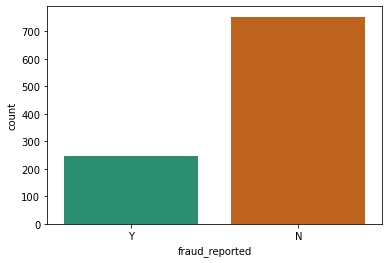

In [47]:
# Visualizing how many insurance claims is fraudulent
print(df['fraud_reported'].value_counts())
sns.countplot(df['fraud_reported'],palette='Dark2')
plt.show()

N    753
Y    247
Name: fraud_reported, dtype: int64


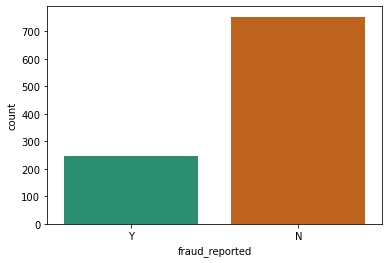

In [48]:
# Visualizing how many insurance claims is fraudulent
print(df['fraud_reported'].value_counts())
sns.countplot(df['fraud_reported'],palette='Dark2')
plt.show()

N    753
Y    247
Name: fraud_reported, dtype: int64


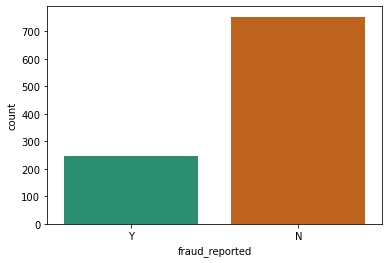

In [49]:
# Visualizing how many insurance claims is fraudulent
print(df['fraud_reported'].value_counts())
sns.countplot(df['fraud_reported'],palette='Dark2')
plt.show()

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


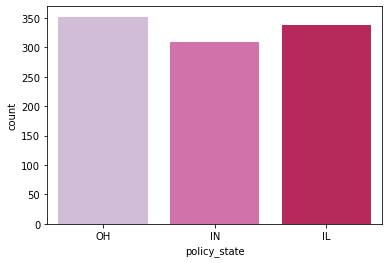

In [51]:
# Visualizing how many policy states are present in the dataset
print(df['policy_state'].value_counts())
sns.countplot(df['policy_state'],palette='PuRd')
plt.show()

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


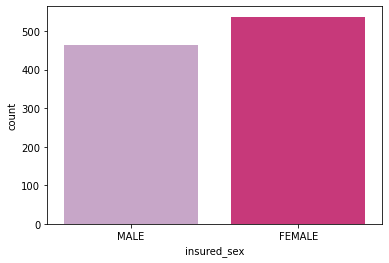

In [52]:
# Visualizing count of insured sex are present in the dataset
print(df['insured_sex'].value_counts())
sns.countplot(df['insured_sex'],palette='PuRd')
plt.show()

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


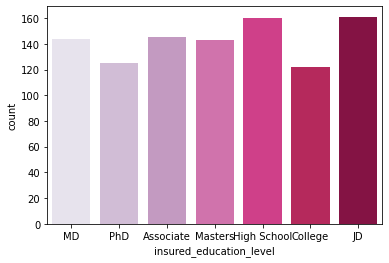

In [53]:
# Visualizing count of customers insured education level are present in the dataset
print(df['insured_education_level'].value_counts())
sns.countplot(df['insured_education_level'],palette='PuRd')
plt.show()

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


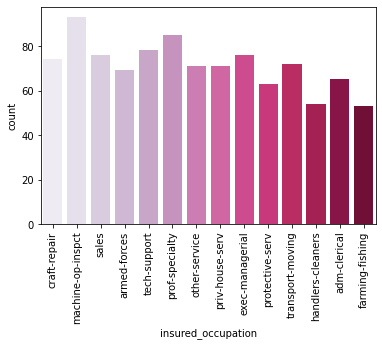

In [56]:
# Visualizing count of customers insured occupation are present in the dataset
print(df['insured_occupation'].value_counts())
sns.countplot(df['insured_occupation'],palette='PuRd')
plt.xticks(rotation=90)
plt.show()

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
base-jumping      49
skydiving         49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


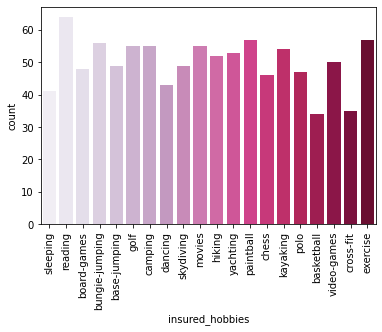

In [58]:
# Visualizing count of insured sex are present in the dataset
print(df['insured_hobbies'].value_counts())
sns.countplot(df['insured_hobbies'],palette='PuRd')
plt.xticks(rotation =90)
plt.show()

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


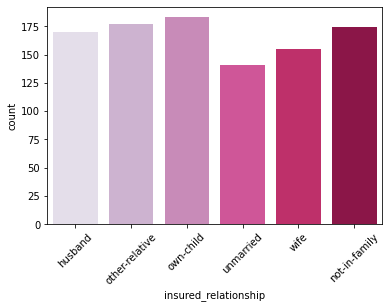

In [60]:
# Visualizing count of what kind of relationship the isured cutomers are in the dataset
print(df['insured_relationship'].value_counts())
sns.countplot(df['insured_relationship'],palette='PuRd')
plt.xticks(rotation = 45)
plt.show()

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


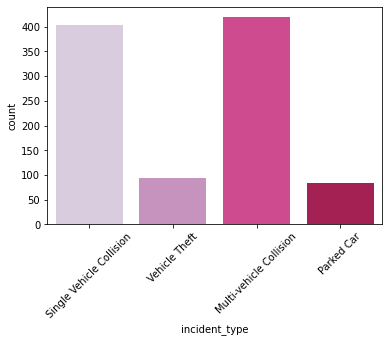

In [62]:
# Visualizing count of insured sex are present in the dataset
print(df['incident_type'].value_counts())
sns.countplot(df['incident_type'],palette='PuRd')
plt.xticks(rotation = 45)
plt.show()

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


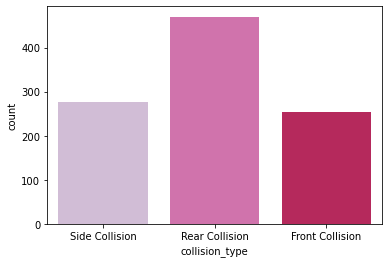

In [63]:
# Visualizing count of insured sex are present in the dataset
print(df['collision_type'].value_counts())
sns.countplot(df['collision_type'],palette='PuRd')
plt.show()

# Checking the distribution of skewness

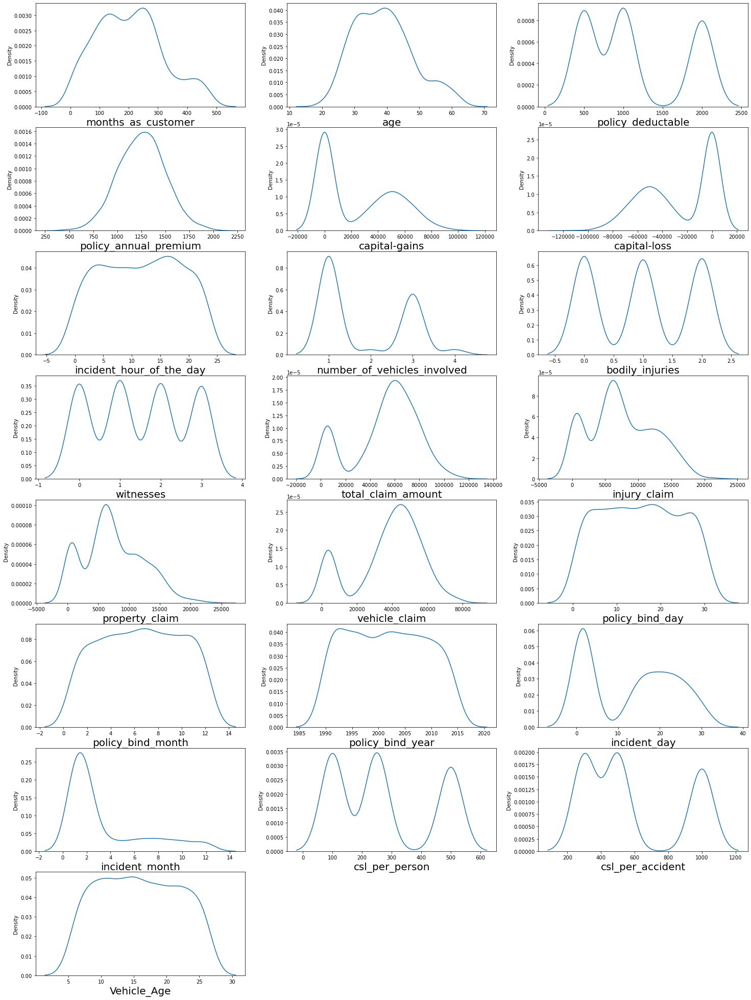

In [69]:
plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(8,3,plotnumber)
        sns.distplot(df[column],hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

From the above distribution plots:
1. Most of the features are normally distributed.
2. The feature capital_gains is right skewed.
3. The feature capital_loss is left skewed.

# Bivariate Analysis

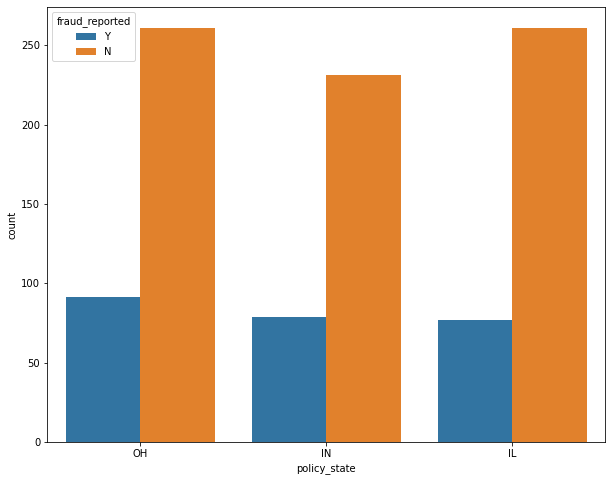

In [73]:
# Comparing policy_state and fraud_reported
plt.figure(figsize=(10,8))
sns.countplot('policy_state',data=df,hue='fraud_reported')
plt.show()

Fraud report is the highest in "OH"(Ohio) policy_state.

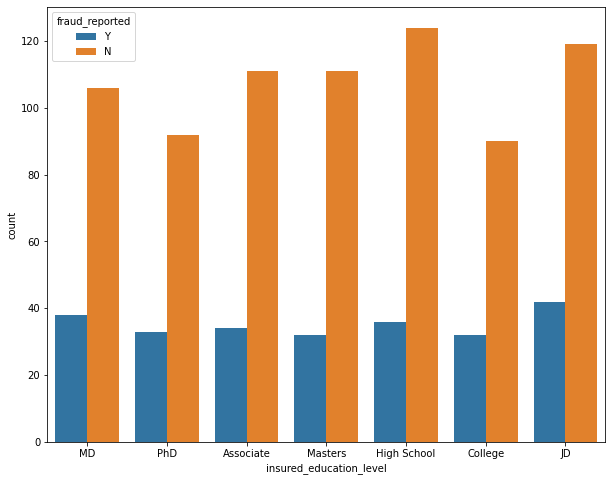

In [74]:
# Comparing insured_education_level and fraud_reported
plt.figure(figsize=(10,8))
sns.countplot('insured_education_level',data=df,hue='fraud_reported')
plt.show()

The fraud is commited mostly by the people who have completed their JD/MD level of education.\
The fraudulent level is very less for the people who have completed their high scool education.

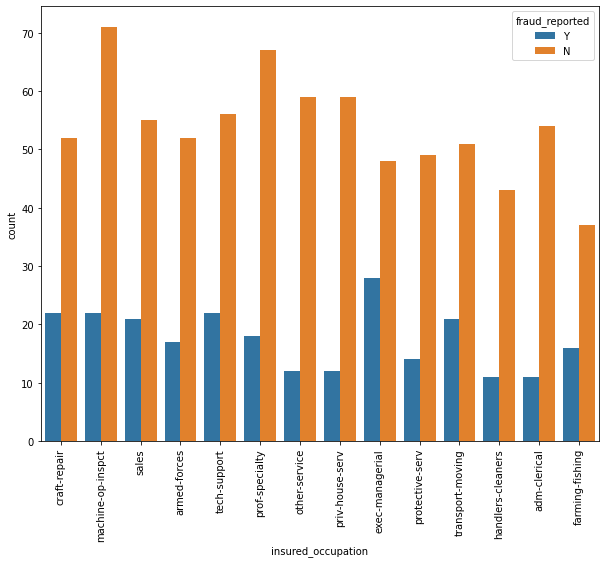

In [76]:
# Comparing insured_occupation and fraud_reported
plt.figure(figsize=(10,8))
sns.countplot('insured_occupation',data=df,hue='fraud_reported')
plt.xticks(rotation=90)
plt.show()

The people who are in the position exec-managerial have high fraud reports compared to others.

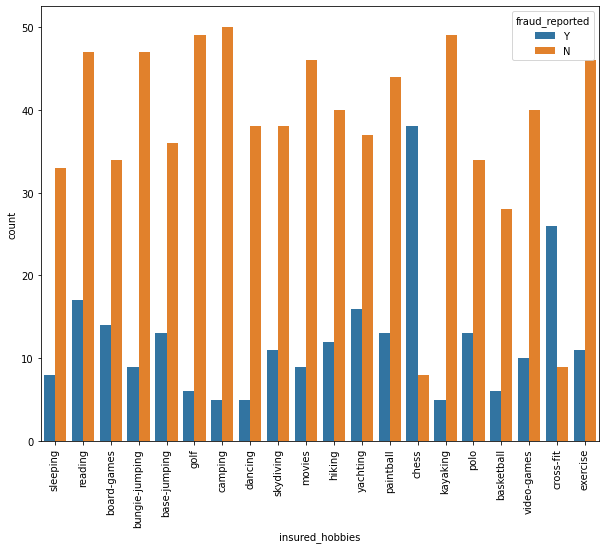

In [78]:
# Comparing insured_hobbies and fraud_reported
plt.figure(figsize=(10,8))
sns.countplot('insured_hobbies',data=df,hue='fraud_reported')
plt.xticks(rotation=90)
plt.show()

The fraud report is high for the people who have the hobby of playing chess and cross fit.



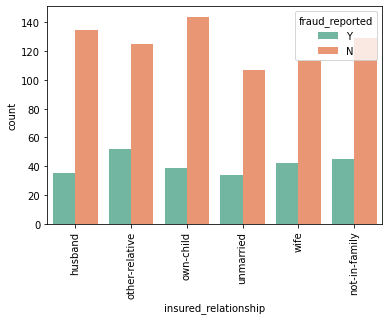

In [80]:
# Comparing insured_relationships and fraud_reported
sns.countplot('insured_relationship',data=df,hue='fraud_reported',palette='Set2')
plt.xticks(rotation=90)
plt.show()

The fraud report is high for the customers who have other relative and it is less for unmarried people.

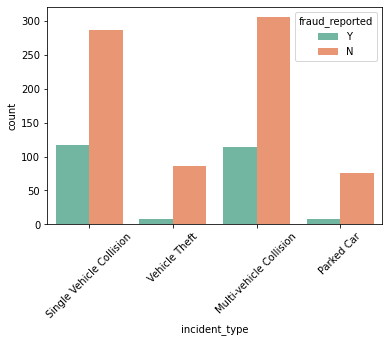

In [83]:
# Comparing incident_type and fraud_reported
sns.countplot('incident_type',data=df,hue='fraud_reported',palette='Set2')
plt.xticks(rotation=45)
plt.show()

The fraud reported when the type of incident is Multivehicle collision and single vehicle collision is high compared to Vehicle theft and parked vehicles

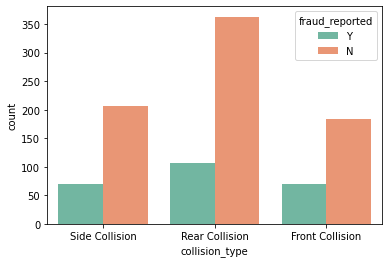

In [85]:
# Comparing collision_type and fraud_reported
sns.countplot('collision_type',data=df,hue='fraud_reported',palette='Set2')
plt.show()

The fraud reported is high when the  collision type is Rear Collision. When the collision type is Side and front the fraud reported is similar.

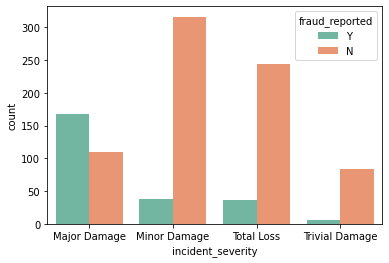

In [86]:
# Comparing incident_Severeity and fraud_reported
sns.countplot('incident_severity',data=df,hue='fraud_reported',palette='Set2')
plt.show()

The fraud report is high when the type of damage is Major damage and fraud commited is the least when the type of damage Trivial Damage.

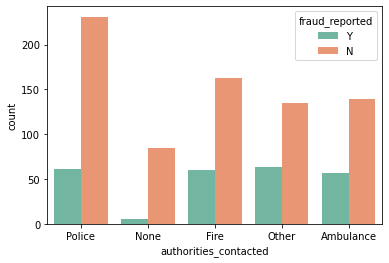

In [87]:
# Comparing authorities_contacted and fraud_reported
sns.countplot('authorities_contacted',data=df,hue='fraud_reported',palette='Set2')
plt.show()

The police contacted cases are very high.

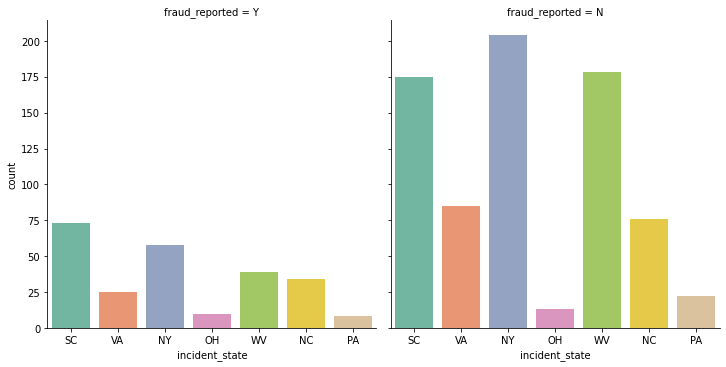

In [91]:
# Comparing incident_state and fraud_reported
sns.catplot(x='incident_state',data=df,kind='count',col='fraud_reported',palette='Set2')
plt.show()

Most fradulant cases have taken place in the state "SC" followed by "NY" and the least in the state "PA".

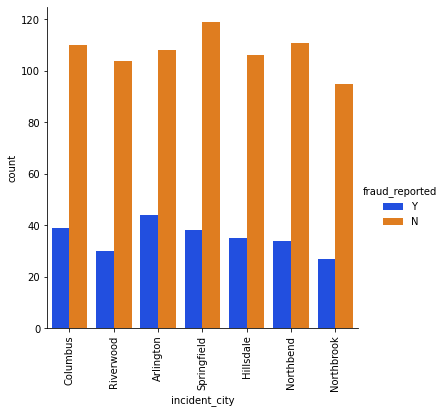

In [92]:
# Comparig incident_city and fraud_reported
sns.catplot('incident_city',kind='count',data=df,hue='fraud_reported',palette="bright")
plt.xticks(rotation=90)
plt.show()

The cities Riverwood and Northbrook have very less fraud reports compared to others.

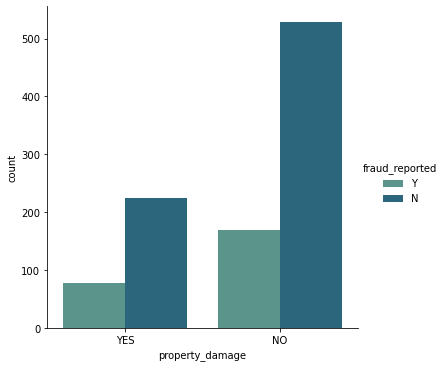

In [103]:
# Comparing property_damage and fraud_reported
sns.catplot('property_damage',kind='count',data=df,hue='fraud_reported',palette="crest")
plt.show()

The number of fraudulant cases reported when property damage is not there is higher.

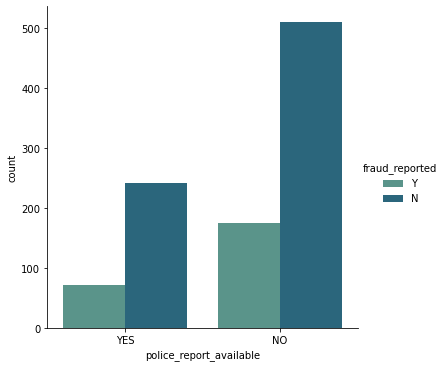

In [102]:
# Comparing police_report_available and fraud_reported
sns.catplot('police_report_available',kind='count',data=df,hue='fraud_reported',palette="crest")
plt.show()

The number of fraudulant cases are more when there are no police reports available.

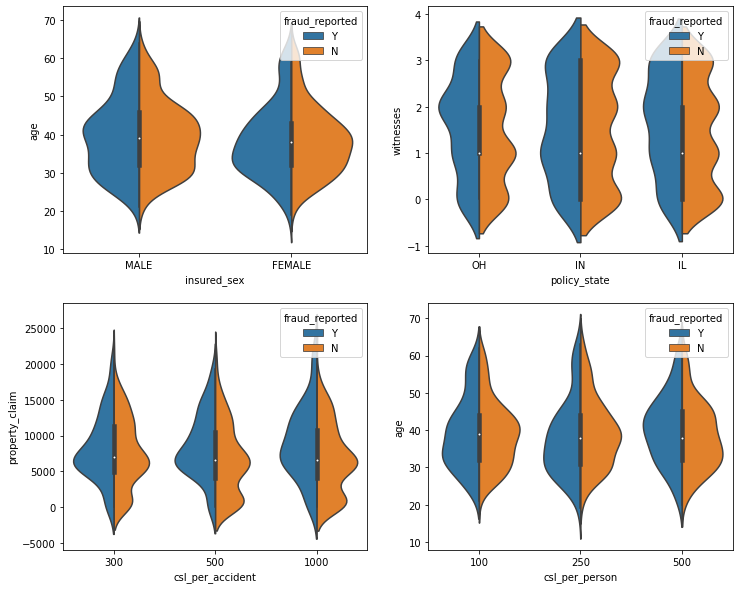

In [106]:
fig,axes=plt.subplots(2,2,figsize=(12,10))

# Comparing insured_sex and age
sns.violinplot(x='insured_sex',y='age',ax=axes[0,0],data=df,hue="fraud_reported",split=True)

# Comparing policy_state and witnesses
sns.violinplot(x='policy_state',y='witnesses',ax=axes[0,1],data=df,hue="fraud_reported",split=True)

# Comparing csl_per_accident and property_claim
sns.violinplot(x='csl_per_accident',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",split=True)

# Comparing csl_per_person and age
sns.violinplot(x='csl_per_person',y='age',ax=axes[1,1],data=df,hue="fraud_reported",split=True)
plt.show()

The fraud report is high for both the males-females having age between 30-45.\
The people who own the policy state "IN" have high fraud report.\
The person who has csl per accidemt insurance by claimimg property in the range 5000-15000 have the fraud report.\
The csl_per_person with age 30-45 are facing the fraudulent reports.

# Multivariate Analysis

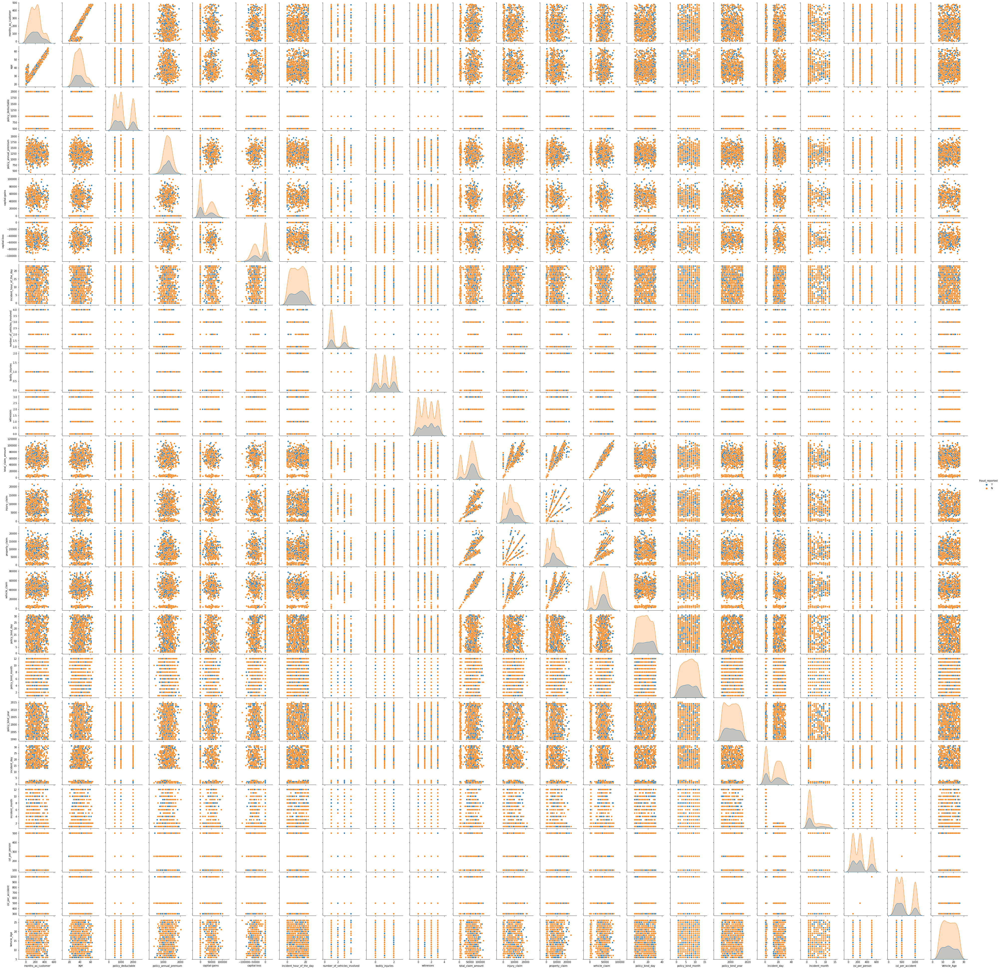

In [108]:
sns.pairplot(df,hue="fraud_reported")
plt.show()

# Checking Outliers

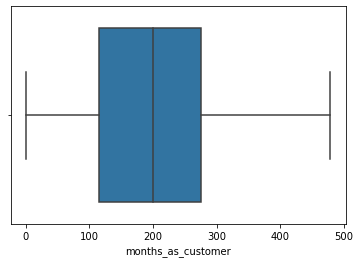

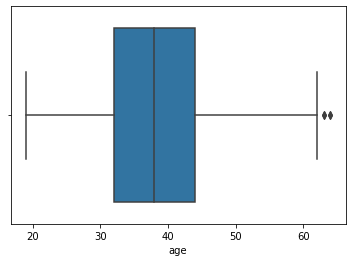

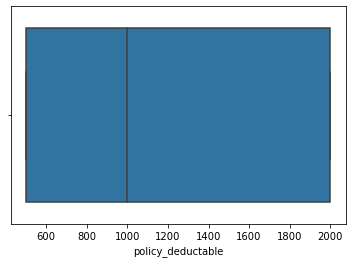

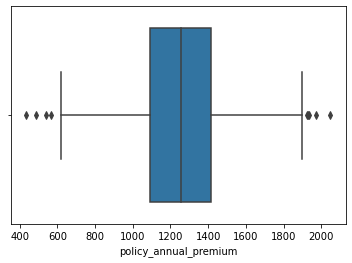

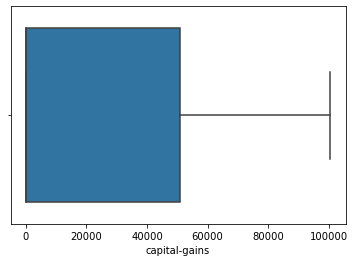

...

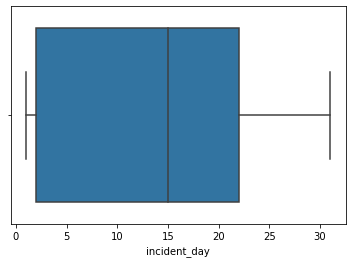

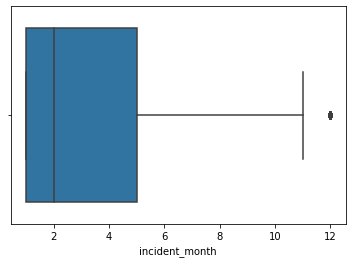

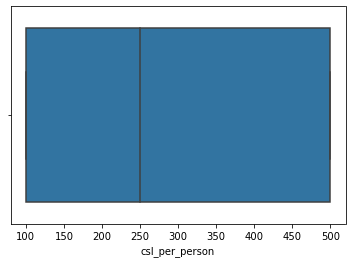

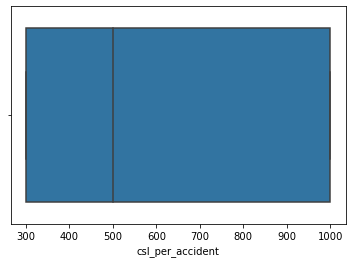

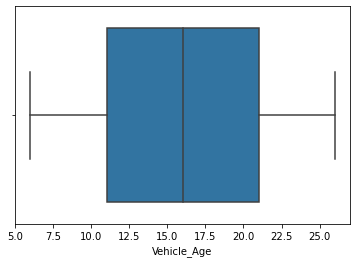

In [111]:
for i in numerical_col:
    sns.boxplot(df[i])
    plt.show()

The features:age, policy_annaul_premium, total_claim_amount, property_claim, incident_month have outliers.

In [113]:
features = df[['age', 'policy_annual_premium', 'total_claim_amount', 'property_claim', 'incident_month']]
from scipy.stats import zscore
z = np.abs(zscore(features))
z

array([[0.99083647, 0.61670461, 0.71425742, 1.16550497, 0.73503976],
       [0.33407345, 0.24252118, 1.80731185, 1.37269599, 0.73503976],
       [1.08891308, 0.64223266, 0.68636176, 0.73607206, 0.42966387],
       ...,
       [0.54161057, 0.52073881, 0.55850675, 0.0208261 , 0.73503976],
       [2.52328351, 0.41186558, 0.21910974, 0.45197603, 0.42966387],
       [2.3043625 , 2.00870981, 1.80769081, 1.34366428, 0.42966387]])

In [114]:
new_df = df[(z<3).all(axis=1)]
new_df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,17,10,2014,25,1,250,500,17
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,27,6,2006,21,1,250,500,14
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,9,6,2000,22,2,100,300,14
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,25,5,1990,1,10,250,500,7
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,6,6,2014,17,2,500,1000,12


In [115]:
df.shape, new_df.shape

((1000, 39), (996, 39))

In [116]:
data_loss = (1000-996)/1000*100
data_loss

0.4

We have lost 0.4% ( 4 rows) of data after removing outliers

# Checking Skewness

In [117]:
new_df.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.593473
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.619755
policy_bind_day                0.028923
policy_bind_month             -0.029722
policy_bind_year               0.058499
incident_day                   0.055659
incident_month                 1.377097
csl_per_person                 0.413713
csl_per_accident               0.609316
Vehicle_Age                    0.049276
dtype: float64

The following features contains skewness:

1. total_claim_amount
2. vehicle_claim
3. incident_month
4. csl_per_accident

# Removing Skewness using yeo-johnson method

In [118]:
skew = ["total_claim_amount","vehicle_claim","incident_month","csl_per_accident"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [119]:
new_df[skew] = scaler.fit_transform(new_df[skew].values)
new_df[skew].head()

,total_claim_amount,vehicle_claim,incident_month,csl_per_accident
0,0.717556,0.754553,-1.101370,0.052612
1,-1.777785,-1.787353,-1.101370,0.052612
2,-0.716483,-0.820820,-0.026479,-1.174021
3,0.392931,0.678427,1.553647,0.052612
4,-1.730555,-1.740710,-0.026479,1.313327


In [120]:
new_df.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.508953
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.521354
policy_bind_day                0.028923
policy_bind_month             -0.029722
policy_bind_year               0.058499
incident_day                   0.055659
incident_month                 0.305741
csl_per_person                 0.413713
csl_per_accident               0.110964
Vehicle_Age                    0.049276
dtype: float64

The skewness has been reduced.

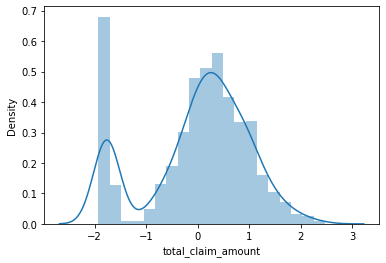

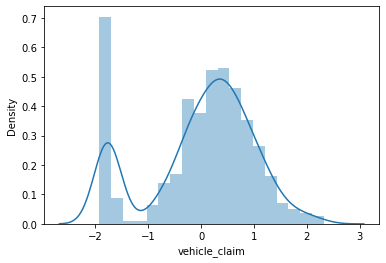

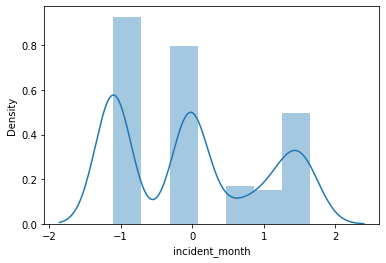

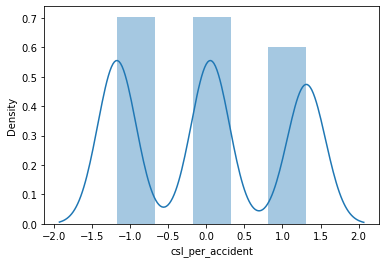

In [121]:
for i in new_df[skew]:
    sns.distplot(new_df[i])
    plt.show()

The data looks almost normally distributed.

# Encoding the catgorical data


In [123]:
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(le.fit_transform)
new_df[categorical_col].head()

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0


# Correlation


In [124]:
corr = new_df.corr()
corr

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
months_as_customer,1.000000,0.922092,0.000118,0.023512,-0.003378,0.059002,-0.000848,0.005365,-0.092575,0.071097,0.007601,0.020771,-0.017202,-0.072479,-0.061932,0.011406,0.006906,-0.001837,0.068962,0.013609,0.002663,-0.011126,0.063530,-0.018760,0.064662,0.066416,0.041157,0.062392,0.049222,0.002908,0.020966,0.054175,0.004955,-0.046010,-0.013502,0.019029,-0.022063,-0.022928,-0.001287
age,0.922092,1.000000,-0.015182,0.026772,0.005890,0.072900,0.001485,0.014030,-0.080587,0.075940,-0.006333,0.008192,-0.025979,-0.075892,-0.060361,0.016000,0.007053,-0.004009,0.085509,0.021140,-0.005795,-0.017461,0.056658,-0.018493,0.070582,0.075480,0.064230,0.062165,0.032105,0.016258,0.012408,0.054465,0.015874,-0.035505,-0.008174,0.016685,-0.012844,-0.012459,-0.003268
policy_state,0.000118,-0.015182,1.000000,0.010740,0.014475,-0.019294,-0.032551,-0.031016,-0.040215,-0.018855,0.072552,-0.032268,0.031769,0.050953,-0.026728,-0.017738,0.009195,-0.004475,0.026464,-0.043447,-0.009334,0.008992,0.024809,0.065957,-0.008788,-0.046398,0.002678,-0.000472,0.015848,-0.024513,0.028864,0.001030,0.071527,-0.005709,0.013370,0.026233,-0.005866,-0.000653,-0.002323
policy_deductable,0.023512,0.026772,0.010740,1.000000,-0.008445,-0.011671,0.014571,-0.050024,0.005134,-0.021763,0.035950,-0.024018,-0.038696,-0.054153,-0.017352,-0.000210,0.007419,-0.046560,0.059733,0.051317,0.014131,-0.023384,0.069433,0.040969,0.025169,0.040337,0.069537,0.005902,-0.034266,-0.003597,0.015833,0.011204,-0.051368,-0.048465,-0.018867,-0.000169,0.006634,0.006179,-0.027497
policy_annual_premium,-0.003378,0.005890,0.014475,-0.008445,1.000000,0.041830,-0.021475,0.030963,-0.014376,0.006474,-0.009757,0.029835,0.049336,0.034999,-0.015788,-0.058852,0.049047,0.047389,-0.003001,-0.044711,0.078922,0.025323,0.006365,0.029619,0.002905,-0.024031,-0.007964,0.012961,0.011595,-0.034998,-0.010174,-0.030886,-0.028452,0.001650,0.016400,-0.012386,0.028569,0.030755,0.040439
insured_sex,0.059002,0.072900,-0.019294,-0.011671,0.041830,1.000000,0.007473,-0.009257,-0.019600,0.004104,-0.020651,-0.024440,0.010572,-0.014399,-0.029576,0.019000,-0.021822,0.013251,0.017950,0.019275,0.025911,-0.020201,0.044173,0.009884,-0.020117,0.004603,-0.009457,-0.026816,0.026040,-0.017679,0.032173,0.045694,-0.007259,-0.031981,-0.007249,0.024223,-0.019001,-0.008959,0.028638
insured_education_level,-0.000848,0.001485,-0.032551,0.014571,-0.021475,0.007473,1.000000,-0.021502,0.022806,-0.021595,0.040283,0.039890,0.012385,-0.020687,-0.007395,-0.011831,-0.006118,-0.019160,-0.057232,-0.001308,-0.048624,-0.011455,0.017577,0.054380,0.076528,0.083672,0.058663,0.070001,0.057528,0.050878,0.011520,0.014464,-0.007489,0.017801,-0.055411,0.069312,0.011093,0.010425,-0.045094
insured_occupation,0.005365,0.014030,-0.031016,-0.050024,0.030963,-0.009257,-0.021502,1.000000,-0.009818,-0.008141,-0.007553,-0.021993,0.003427,0.006634,0.002255,-0.007367,-0.021531,-0.002158,-0.021308,-0.015177,-0.018839,-0.001830,-0.011373,-0.021730,0.006458,0.022693,0.008301,0.000954,0.044321,0.020878,0.003335,-0.003030,0.024516,-0.025282,-0.022786,0.013226,0.018978,0.019575,0.004827
insured_hobbies,-0.092575,-0.080587,-0.040215,0.005134,-0.014376,-0.019600,0.022806,-0.009818,1.000000,-0.097837,0.053503,-0.032345,0.008256,0.016756,-0.023999,-0.028153,0.085633,0.018605,0.019802,0.011927,0.036599,0.030730,-0.034308,-0.030149,-0.003759,0.028415,0.009925,-0.015968,-0.0000

<AxesSubplot:>

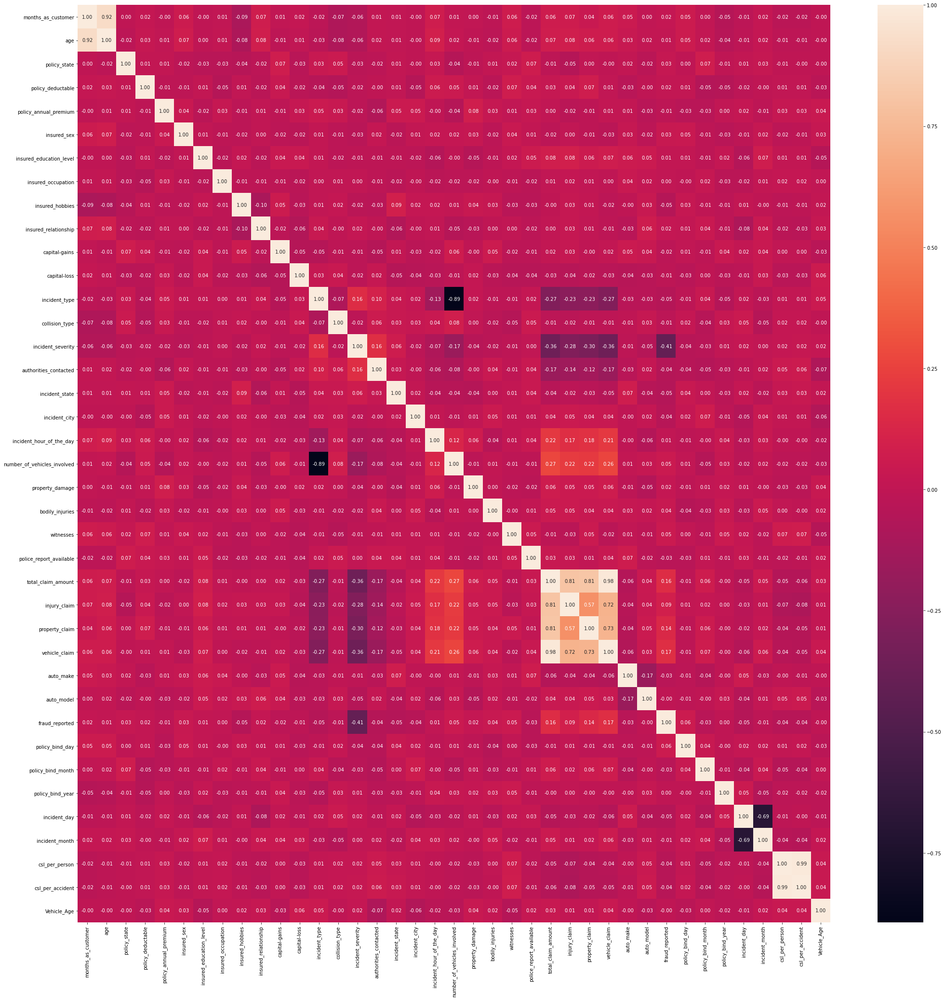

In [127]:
plt.figure(figsize=(35,35))
sns.heatmap(corr,annot=True,fmt ='.2f')
plt.show()

Observations from correlation:
1. There is very less correlation between the target and the label.
2. We can observe the most of the columns are highly correlated with each other which leads to the multicollinearity problem.
3. We will check the VIF value to overcome with this multicollinearity problem.

In [128]:
x = new_df.drop("fraud_reported", axis=1)
y = new_df["fraud_reported"]

In [129]:
x.shape, y.shape

((996, 38), (996,))

# Standarard Scaler

In [130]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,csl_per_person,csl_per_accident,Vehicle_Age
0,1.074671,0.987190,1.186130,-0.224722,0.621371,1.075102,0.531088,-1.162296,1.280299,-1.436113,1.010158,0.953763,0.765670,1.343731,-1.261019,1.196829,0.352556,-0.964353,-0.959495,-0.824928,1.515920,0.007356,0.466826,1.480644,0.717556,-0.188161,1.174449,0.754553,0.857248,-1.644810,0.177487,1.013751,1.686176,1.139807,-1.101370,-0.137684,0.052612,0.182338
1,0.204846,0.330455,-0.018137,1.409024,-0.251375,1.075102,0.531088,-0.166257,0.928186,-0.246617,-0.900970,0.953763,1.690043,-0.030351,-0.197535,1.196829,0.815808,0.992846,-0.527592,-0.824928,-0.659665,-1.213749,-1.335340,-0.675382,-1.777785,-1.363038,-1.376935,-1.787353,0.360986,-0.657437,1.309223,-0.166145,0.599693,0.756374,-1.101370,-0.137684,0.052612,-0.316587
2,-0.612790,-1.092470,1.186130,1.409024,0.647301,-0.930144,1.557206,1.078792,-1.360550,0.348131,0.357578,0.953763,-1.083075,-0.030351,-0.197535,1.196829,-1.037202,-0.964353,-0.671560,1.138341,-0.659665,1.228462,1.367910,-0.675382,-0.716483,0.055836,-0.737005,-0.820820,-0.631538,0.958263,-0.727901,-0.166145,-0.215170,0.852233,-0.026479,-1.066352,-1.174021,-0.316587
3,0.448397,0.221000,-1.222403,1.409024,0.658123,-0.930144,1.557206,-1.411305,-1.360550,0.942878,0.852392,-1.269246,0.765670,-1.404433,-1.261019,1.196829,-0.573950,-1.453652,-0.959495,-0.824928,-0.659665,0.007356,0.466826,-0.675382,0.392931,-0.223018,-0.217973,0.678427,-0.879669,1.317308,1.082875,-0.461119,-1.573274,-1.160788,1.553647,-0.137684,0.052612,-1.480744
4,0.204846,0.549367,-1.222403,-0.224722,1.358059,1.075102,-1.521148,1.078792,-1.360550,0.942878,1.465530,-0.684994,1.690043,-0.030351,-0.197535,-0.108088,-1.037202,-1.453652,1.200020,-0.824928,-0.659665,-1.213749,-0.434257,-0.675382,-1.730555,-1.256417,-1.404033,-1.740710,-1.624063,1.048024,-1.067422,-0.166145,1.686176,0.372942,-0.026479,1.410096,1.313327,-0.649203


# Checking Multicolinearity

In [131]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.851319,months_as_customer
1,6.855557,age
2,1.039410,policy_state
3,1.045656,policy_deductable
4,1.037450,policy_annual_premium
5,1.037410,insured_sex
6,1.047043,insured_education_level
7,1.017493,insured_occupation
8,1.052669,insured_hobbies
9,1.052965,insured_relationship


Drop total_claim_amount as VIF>10

In [132]:
x.drop(['total_claim_amount'],axis=1,inplace=True)

In [133]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.849523,months_as_customer
1,6.855452,age
2,1.039378,policy_state
3,1.044129,policy_deductable
4,1.036722,policy_annual_premium
5,1.034404,insured_sex
6,1.046991,insured_education_level
7,1.016776,insured_occupation
8,1.050855,insured_hobbies
9,1.052941,insured_relationship


Drop csl_per_person as VIF>10

In [135]:
x.drop('csl_per_person',axis=1,inplace=True)

In [136]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,6.848109,months_as_customer
1,6.853750,age
2,1.038033,policy_state
3,1.043957,policy_deductable
4,1.036476,policy_annual_premium
5,1.028901,insured_sex
6,1.046977,insured_education_level
7,1.016722,insured_occupation
8,1.049220,insured_hobbies
9,1.049218,insured_relationship


Multicolineaity problem has been solved.

In [137]:
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

# Oversampling

In [138]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y = SM.fit_resample(x,y)

In [139]:
y.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

# Model Building

### Finding the best random state

In [140]:
from sklearn.model_selection import train_test_split as TTS
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=TTS(x,y,test_size=0.30,random_state=i)
    RFC = RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred = RFC.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu,"at random state",maxRS)

Best accuracy is  0.92 at random state 41


In [141]:
x_train,x_test,y_train,y_test=TTS(x,y,test_size=.30,random_state=maxRS)

In [142]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

# Random Forest Classifier

In [143]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC = RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.9155555555555556
[[215  17]
 [ 21 197]]
              precision    recall  f1-score   support

           0       0.91      0.93      0.92       232
           1       0.92      0.90      0.91       218

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



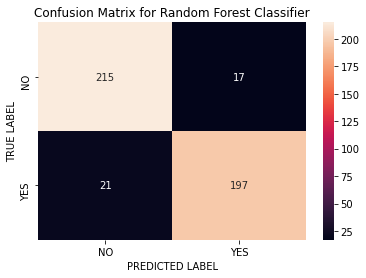

In [160]:
cm = confusion_matrix(y_test,predRFC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

# Decision Tree Classifier

In [166]:
DTC = DecisionTreeClassifier()
DTC.fit(x_train,y_train)
predDTC = DTC.predict(x_test)
print(accuracy_score(y_test,predDTC))
print(confusion_matrix(y_test,predDTC))
print(classification_report(y_test,predDTC))

0.86
[[206  26]
 [ 37 181]]
              precision    recall  f1-score   support

           0       0.85      0.89      0.87       232
           1       0.87      0.83      0.85       218

    accuracy                           0.86       450
   macro avg       0.86      0.86      0.86       450
weighted avg       0.86      0.86      0.86       450



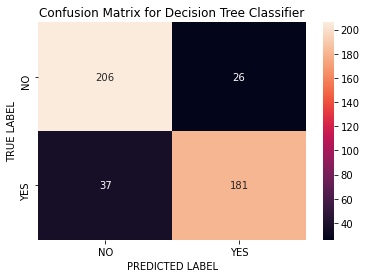

In [167]:
cm = confusion_matrix(y_test,predDTC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True,fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

# Support Vector Machine Classifier


In [145]:
svc = SVC()
svc.fit(x_train,y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.88
[[201  31]
 [ 23 195]]
              precision    recall  f1-score   support

           0       0.90      0.87      0.88       232
           1       0.86      0.89      0.88       218

    accuracy                           0.88       450
   macro avg       0.88      0.88      0.88       450
weighted avg       0.88      0.88      0.88       450



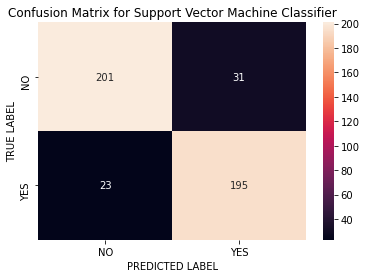

In [146]:
cm = confusion_matrix(y_test,predsvc)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True,fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Support Vector Machine Classifier')
plt.show()

# Gradient Boosting Classifier


In [147]:
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB = GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

0.9244444444444444
[[213  19]
 [ 15 203]]
              precision    recall  f1-score   support

           0       0.93      0.92      0.93       232
           1       0.91      0.93      0.92       218

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



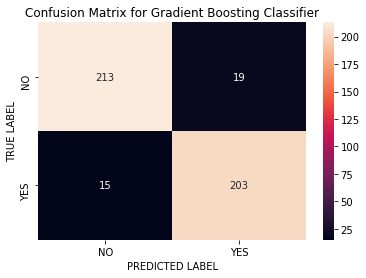

In [159]:
cm = confusion_matrix(y_test,predGB)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True,fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

# AdaBoost Classifier

In [150]:
ABC = AdaBoostClassifier()
ABC.fit(x_train,y_train)
predABC = ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))

0.8733333333333333
[[204  28]
 [ 29 189]]
              precision    recall  f1-score   support

           0       0.88      0.88      0.88       232
           1       0.87      0.87      0.87       218

    accuracy                           0.87       450
   macro avg       0.87      0.87      0.87       450
weighted avg       0.87      0.87      0.87       450



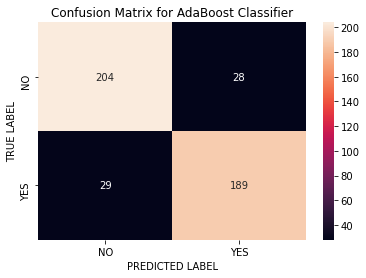

In [158]:
cm = confusion_matrix(y_test,predABC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for AdaBoost Classifier')
plt.show()

# Bagging Classifier

In [152]:
BC = BaggingClassifier()
BC.fit(x_train,y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))

0.8955555555555555
[[214  18]
 [ 29 189]]
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       232
           1       0.91      0.87      0.89       218

    accuracy                           0.90       450
   macro avg       0.90      0.89      0.90       450
weighted avg       0.90      0.90      0.90       450



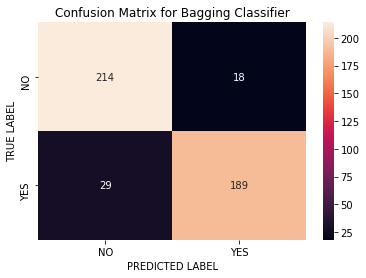

In [157]:
cm = confusion_matrix(y_test,predBC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f", xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Bagging Classifier')
plt.show()

# ExtraTrees Classifier

In [154]:
ET = ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET = ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))

0.9177777777777778
[[211  21]
 [ 16 202]]
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       232
           1       0.91      0.93      0.92       218

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



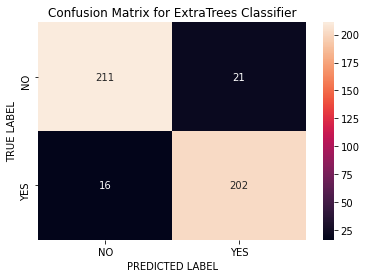

In [156]:
cm = confusion_matrix(y_test,predET)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for ExtraTrees Classifier')
plt.show()

# XG Boost Classifier

In [161]:
XGB = xgb(verbosity=0)
XGB.fit(x_train,y_train)
predXGB = XGB.predict(x_test)
print(accuracy_score(y_test,predXGB))
print(confusion_matrix(y_test,predXGB))
print(classification_report(y_test,predXGB))

0.9222222222222223
[[213  19]
 [ 16 202]]
              precision    recall  f1-score   support

           0       0.93      0.92      0.92       232
           1       0.91      0.93      0.92       218

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



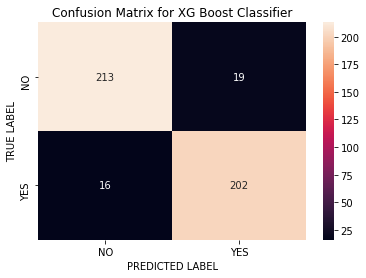

In [162]:
cm = confusion_matrix(y_test,predXGB)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XG Boost Classifier')
plt.show()

# Checking Cross Validation Score


In [163]:
from sklearn.model_selection import cross_val_score

In [165]:
print("Cross_Validation_Score using Random Forest Classifier:",cross_val_score(RFC,x,y,cv=5).mean())

Cross_Validation_Score using Random Forest Classifier: 0.8766666666666666


In [168]:
print("Cross_Validation_Score using Decision Tree Classifier:",cross_val_score(DTC,x,y,cv=5).mean())

Cross_Validation_Score using Decision Tree Classifier: 0.8413333333333334


In [169]:
print("Cross_Validation_Score using Support Vector Classifier:",cross_val_score(svc,x,y,cv=5).mean())

Cross_Validation_Score using Support Vector Classifier: 0.8706666666666667


In [170]:
print("Cross_Validation_Score using Gradient Boosting Classifier:",cross_val_score(GB,x,y,cv=5).mean())

Cross_Validation_Score using Gradient Boosting Classifier: 0.8753333333333334


In [171]:
print("Cross_Validation_Score using AdaBoosting Classifier:",cross_val_score(ABC,x,y,cv=5).mean())

Cross_Validation_Score using AdaBoosting Classifier: 0.8466666666666665


In [172]:
print("Cross_Validation_Score using Bagging Classifier:",cross_val_score(BC,x,y,cv=5).mean())

Cross_Validation_Score using Bagging Classifier: 0.876


In [173]:
print("Cross_Validation_Score using ExtraTrees Classifier:",cross_val_score(ET,x,y,cv=5).mean())

Cross_Validation_Score using ExtraTrees Classifier: 0.9073333333333332


In [174]:
print("Cross_Validation_Score using XG Boost Classifier:",cross_val_score(XGB,x,y,cv=5).mean())

Cross_Validation_Score using XG Boost Classifier: 0.882


### Best Model - ExtraTrees Classifier

# Hyperparameter Tuning

In [175]:
from sklearn.model_selection import GridSearchCV

parameters = {'criterion':['gini','entrophy'],
             'max_features':['auto','sqrt','log2'],
             'max_depth':[0,10,20],
             'n_jobs':[-2,-1,1],
             'n_estimators':[50,100,200,300]}

In [176]:
GCV = GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [177]:
GCV.fit(x_train,y_train)

exception calling callback for <Future at 0x228029e7370 state=finished raised KeyError>
Traceback (most recent call last):
  File "C:\Users\RAJIT\anaconda\lib\site-packages\joblib\externals\loky\_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "C:\Users\RAJIT\anaconda\lib\site-packages\joblib\parallel.py", line 366, in __call__
    self.parallel.dispatch_next()
  File "C:\Users\RAJIT\anaconda\lib\site-packages\joblib\parallel.py", line 799, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "C:\Users\RAJIT\anaconda\lib\site-packages\joblib\parallel.py", line 866, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\RAJIT\anaconda\lib\site-packages\joblib\parallel.py", line 784, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "C:\Users\RAJIT\anaconda\lib\site-packages\joblib\_parallel_backends.py", line 531, in apply_async
    future = self._workers.submit(SafeFunction(func))
  File "C:\Users\RA

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entrophy'],
                         'max_depth': [0, 10, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1]})

In [178]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'auto',
 'n_estimators': 300,
 'n_jobs': -2}

In [179]:
Insurance_model =  ExtraTreesClassifier(criterion='gini',max_features='auto',max_depth=20,n_estimators=300,n_jobs=-2)
Insurance_model.fit(x_train,y_train)
pred = Insurance_model.predict(x_test)
acc = accuracy_score(y_test,pred)
print(acc*100)

91.55555555555556


### We get an accuracy of 91.55% after hyperparameter tuning

# Plotting ROC and compare AUC for all the models used


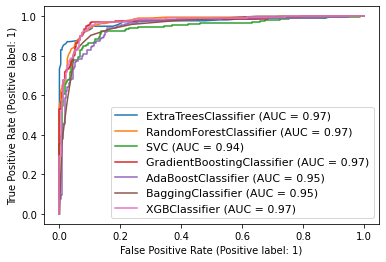

In [180]:
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 


disp = plot_roc_curve(ET,x_test,y_test)     # ax_=Axes with confusion matrix
plot_roc_curve(RFC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(svc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(GB, x_test, y_test, ax=disp.ax_)
plot_roc_curve(ABC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(BC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(XGB, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

# Plotting ROC for the Best Model

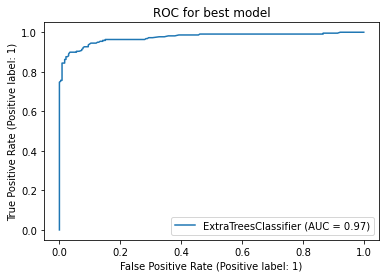

In [181]:
plot_roc_curve(Insurance_model,x_test,y_test)
plt.title("ROC for best model")
plt.show()

# Saving the Model

In [182]:
import pickle
filename = 'insurance.pkl'
pickle.dump(RFC, open(filename, 'wb'))

In [185]:
prediction = Insurance_model.predict(x_test)
prediction

array([1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0,

In [186]:
a = np.array(y_test)
df = pd.DataFrame()
df["Predicted"] = prediction
df["Original"] = a
df

,Predicted,Original
0,1,1
1,1,1
2,1,1
3,0,0
4,1,1
...,...,...
445,1,1
446,0,0
447,0,1
448,0,0
